In [21]:
!pip install opencv-python
import requests
import cv2 
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import math
import dlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


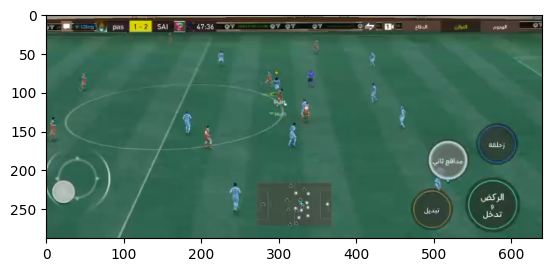

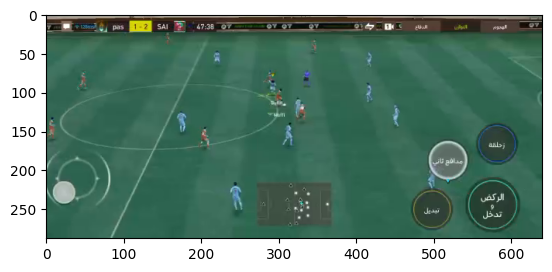

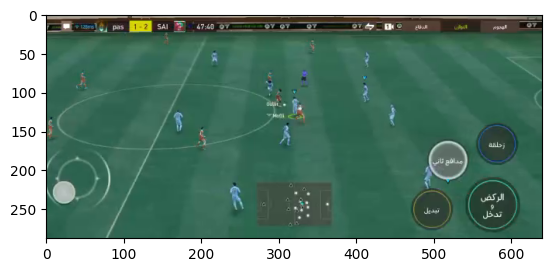

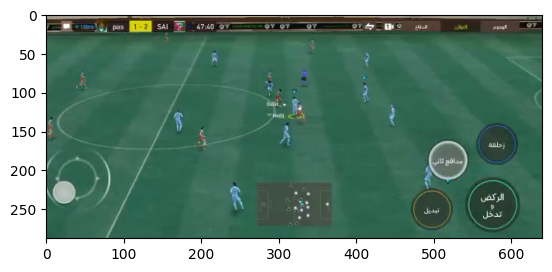

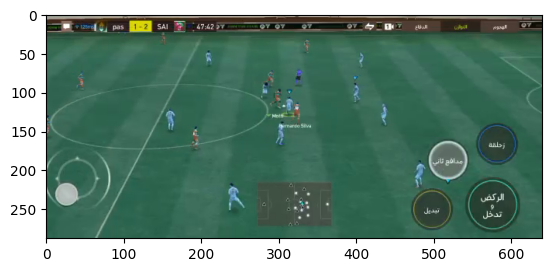

...

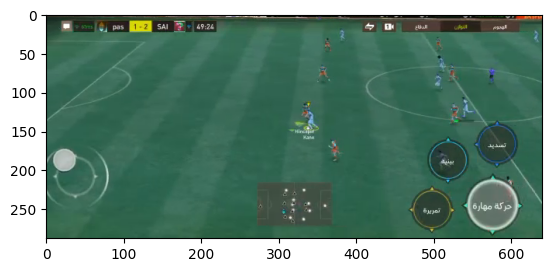

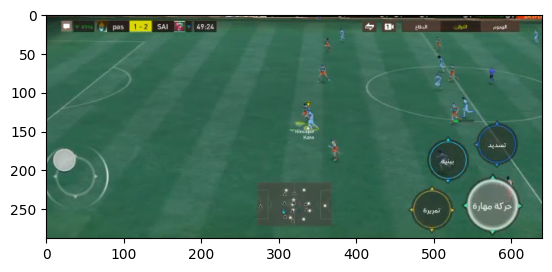

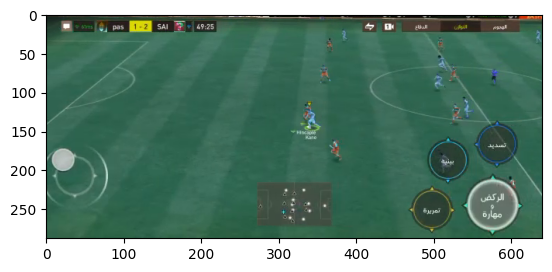

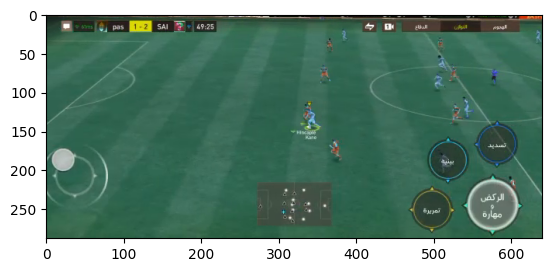

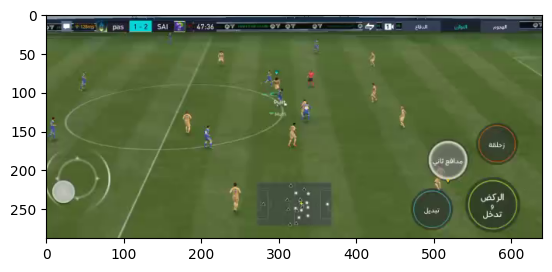

In [22]:
# Step 1 , 2
frames = []
cap = cv2.VideoCapture("DataExample.mp4")

count = 0
frame_count= 0
for i in range(100):
    success, frame = cap.read()
    if not success:
        break  # exit the loop if no more frames can be read
    else :
        frames.append(frame)
        plt.imshow(frames[i])
        plt.show()
        output_path = f"/content/frame_numeber_{frame_count}.png"
        cv2.imwrite(output_path,frame)
        # cv2.imwrite('frame.jpg',frame)
        

        frame_count= frame_count + 1
        count = count + 1
        if count == 96:
          break



# img = cv2.imread("photo_number_0.png")


img2= cv2.cvtColor(frames[0],cv2.COLOR_BGR2RGB)
plt.imshow(img2)
plt.show()

In [23]:
# Step 3

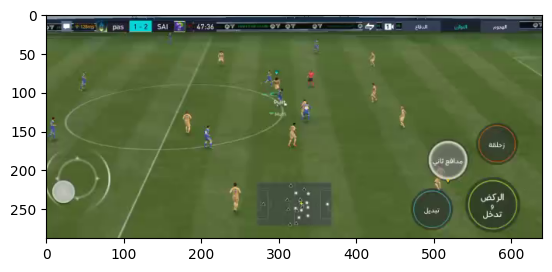

In [24]:
img3= cv2.cvtColor(frames[93],cv2.COLOR_BGR2RGB)
plt.imshow(img2)
plt.show()

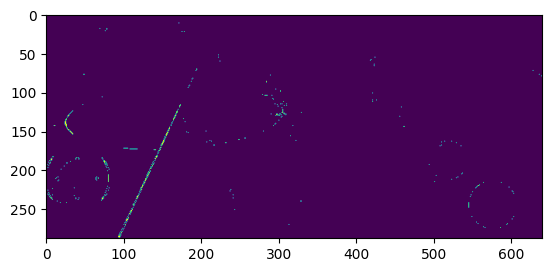

In [26]:
lower = 125,144,96
upper = 150,170,120


mask = cv2.inRange(img2,lower,upper)
plt.imshow(mask)
plt.show()

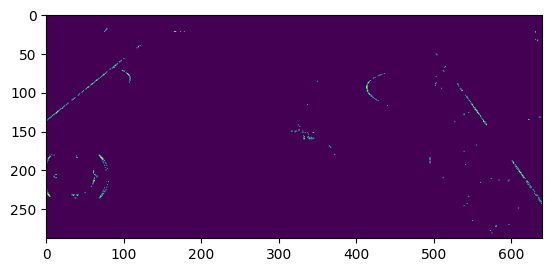

In [25]:
lower = 125,144,96
upper = 150,170,120


mask = cv2.inRange(img3,lower,upper)
plt.imshow(mask)
plt.show()

In [27]:
# Step 4

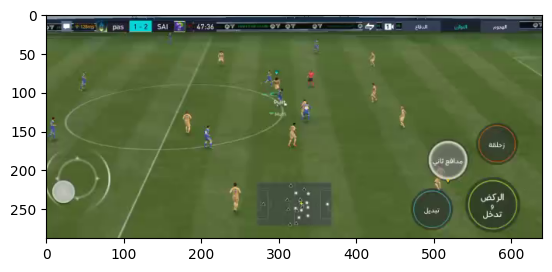

In [28]:
plt.imshow(img2)
plt.show()

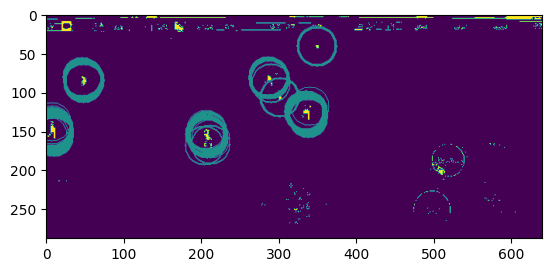

In [61]:
# For blue players 
lower_b = 30,30,110
upper_b = 140,140,230
mask_b = cv2.inRange(img2, lower_b, upper_b)
# plt.subplot(1, 2, 1)
# plt.imshow(img2)
# plt.subplot(1, 2, 2)
for i in range(mask_b.shape[1]):
    for j in range(mask_b.shape[0]):
        if i<mask_b.shape[1]-1 and j<mask_b.shape[0]-1 and mask_b[j][i]==255 and mask_b[j][i+1]==255 and mask_b[j+1][i+1]==255 and 0 <i < 435 and 25 < j < 180:    
            x=i
            y=j
            cv2.circle(mask_b, (x, y), 25, (130,255,0), 1)

plt.imshow(mask_b)
plt.show()  

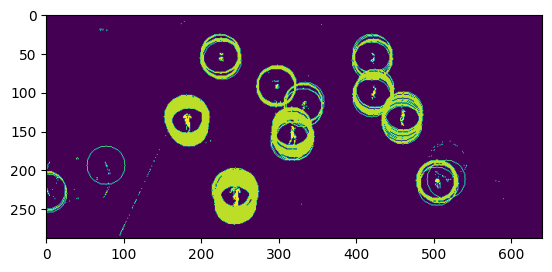

In [59]:
# For yellow players 
lower_o = 154,116,52
upper_o = 245,195,145
mask_o = cv2.inRange(img2, lower_o, upper_o)
# plt.subplot(1, 2, 1)
# plt.imshow(img2)
# plt.subplot(1, 2, 2)
for i in range(mask_o .shape[1]):
    for j in range(mask_o .shape[0]):
        if i<mask_o .shape[1]-1 and j<mask_o .shape[0]-1 and mask_o [j][i]==255 and mask_o [j][i+1]==255 and mask_o [j+1][i+1]==255 :
          x = i
          y = j
          cv2.circle(mask_o , (x,y), 25, (230,179,113), 1)
plt.imshow(mask_o)
plt.show()

In [31]:
# step 5

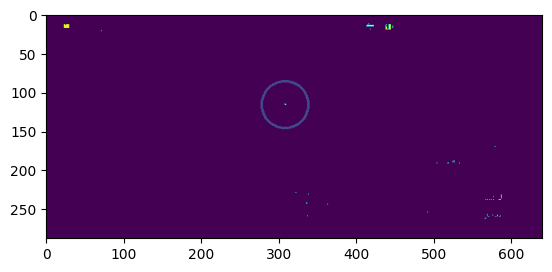

In [32]:
# for k in range(100): 
lower_ball = 150,235,190
upper_ball = 255,255,255
mask_ball = cv2.inRange(frames[0], lower_ball, upper_ball)
# plt.imshow(mask_b)
# plt.show()
for i in range(mask_ball.shape[1]):
    for j in range(mask_ball.shape[0]):
        if i<mask_ball.shape[1]-1 and j<mask_ball.shape[0]-1 and mask_ball[j][i]==255 and mask_ball[j][i+1]==255 and 200< i < 320 and 80 < j < 120 :
          x = i
          y = j
          cv2.circle(mask_ball, (x,y), 30, (61,109,100), 2)

plt.imshow(mask_ball)
plt.show() 

In [33]:
# step 6

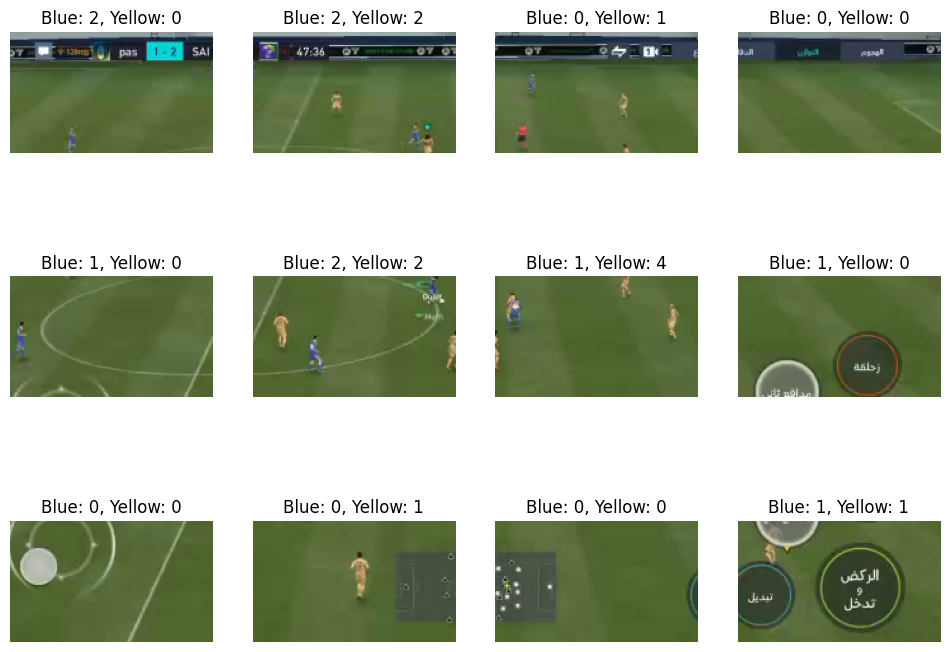

In [34]:
crops = []
width = img2.shape[1]
height = img2.shape[0]
cx = width // 4
cy = height // 3

b_p = [(11, 149), (50, 87), (160, 36), (207, 158), (288, 84), (300, 104), (339, 133), (508, 194), (529, 178)]
y_p = [(184, 145), (225, 58), (247, 239), (297, 94), (320, 165), (332, 118), (422, 59), (424, 98), (461, 132), (507, 221)]

for j in range(3):
    for i in range(4):
        x = i * cx
        y = j * cy

        
        blue_count = 0
        for player in b_p:
            if player[0] >= x and player[1] >= y and player[0] <= x + cx and player[1] <= y + cy:
                blue_count += 1

        
        yellow_count = 0
        for player in y_p:
            if player[0] >= x and player[1] >= y and player[0] <= x + cx and player[1] <= y + cy:
                yellow_count += 1

        crops.append({'crop': img2[y:y+cy, x:x+cx], 'blue_count': blue_count, 'yellow_count': yellow_count})

plt.figure(figsize=(12, 9))

for i in range(len(crops)):
    if i < 12:
        plt.subplot(3, 4, i+1)
        plt.imshow(crops[i]['crop'])
        plt.title(f"Blue: {crops[i]['blue_count']}, Yellow: {crops[i]['yellow_count']}")
        plt.axis('off')

plt.show()